<a href="https://colab.research.google.com/github/nabdelouali/FMCW_Radar/blob/main/Animation_Phaseur_FFT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
from IPython.display import HTML, display
from scipy.interpolate import make_interp_spline

# ---- Définition de la Palette de Couleurs ----
colors = {
    'beige_bg': '#F5F2E0',
    'grey_plot_bg': '#E5E5E5',
    'strong_red': '#B80000',
    'dark_grey_signal': '#4A4A4A',
    'black': '#000000',
    'blue_ideal': '#0033A0' # ADDED: A new color for the ideal spike
}

# Le style ggplot est une bonne base, mais nous allons le personnaliser.
plt.style.use('ggplot')

In [2]:
# ---- Paramètres de l'animation ----
A = 1.0  # Amplitude du phaseur
omega = 2 * np.pi / 30  # Fréquence angulaire (ω ≈ 0.21)
num_frames = 60  # Durée de l'animation

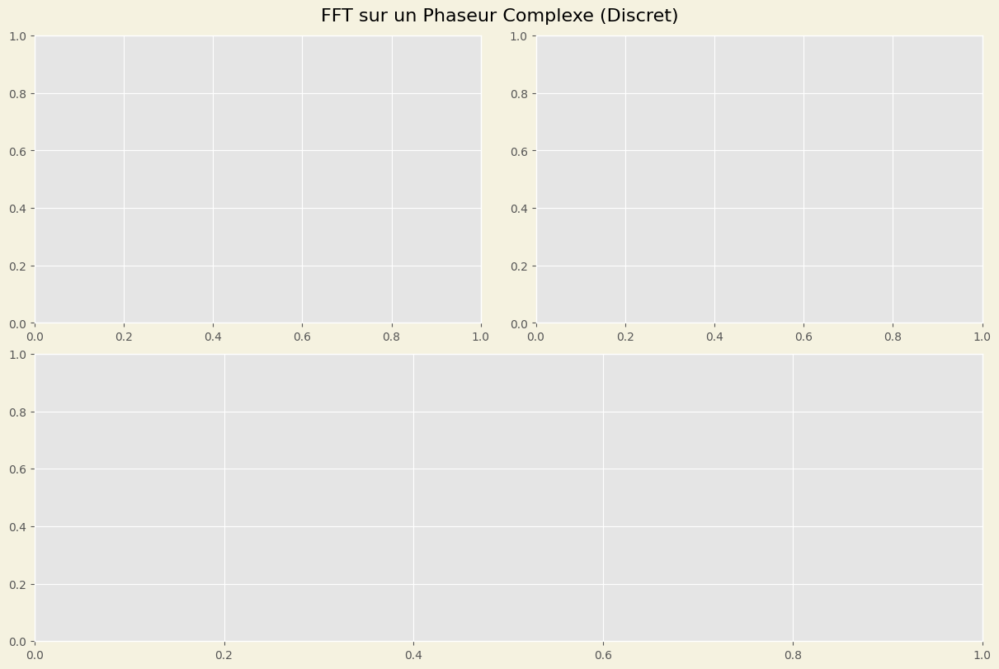

In [3]:
# Création de la figure avec une couleur de fond personnalisée
fig = plt.figure(figsize=(12, 8), constrained_layout=True)
fig.set_facecolor(colors['beige_bg'])
fig.suptitle("FFT sur un Phaseur Complexe (Discret)", fontsize=16)

# Création d'une grille 2x2 pour disposer les sous-graphiques
gs = fig.add_gridspec(2, 2)

# Assignation des axes à la grille
ax_phasor = fig.add_subplot(gs[0, 0])
ax_time = fig.add_subplot(gs[0, 1])
ax_fft = fig.add_subplot(gs[1, :])

In [4]:
# ---- Pré-calcul des données complètes pour les tracés statiques ----
t_full = np.arange(num_frames)
phasor_x_full = A * np.cos(omega * t_full)

# --- 4.1 Configuration de l'axe du Phaseur ---
ax_phasor.set_title("Phaseur Tournant et sa Trace")
ax_phasor.set_aspect('equal')
ax_phasor.set_anchor('W')
ax_phasor.set_xlim(-A * 1.2, A * 1.2); ax_phasor.set_ylim(-A * 1.2, A * 1.2)

ax_phasor.set_xlabel("Partie Réelle (Re)"); ax_phasor.set_ylabel("Partie Imaginaire (Im)")
ax_phasor.plot(A * np.cos(omega * t_full), A * np.sin(omega * t_full), '.', color=colors['black'], markersize=5, label="Échantillons k")
phasor_arrow, = ax_phasor.plot([], [], color=colors['strong_red'], lw=2, label="Phaseur A*e^(jωk)")
phasor_dot, = ax_phasor.plot([], [], 'o', color=colors['strong_red'], markersize=8)
phasor_legend_label = fr"$A \cdot e^{{j\omega k}}$ with $\omega \approx {omega:.3f}$"
ax_phasor.legend([phasor_arrow], [phasor_legend_label], bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

# --- 4.2 Configuration de l'axe du Signal Temporel ---
ax_time.set_title("Signal Temporel Échantillonné (Partie Réelle)")
ax_time.set_xlim(0, num_frames); ax_time.set_ylim(-A * 1.2, A * 1.2)
ax_time.set_xlabel("Temps (indice k)"); ax_time.set_ylabel("Re{signal} = A*cos(ωk)")
ax_time.plot(t_full, phasor_x_full, 'o-', color=colors['dark_grey_signal'], markersize=4, label="Partie réelle")
time_marker, = ax_time.plot([], [], 'o', color=colors['strong_red'], markersize=8)
# CHANGED: Using LaTeX for the formula and inserting the value of omega.
time_legend_label = r"$Re\{signal\} = A \cdot \cos(\omega k)$"
ax_time.legend([time_marker], [time_legend_label], bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
time_data_y = []

# --- 4.3 Configuration de l'axe de la FFT ---
ax_fft.set_title("Transformée de Fourier Discrète (FFT Calculée)")
ax_fft.set_xlabel("Fréquence Angulaire Discrète (ω) [rad/éch.]"); ax_fft.set_ylabel("Amplitude FFT")
ax_fft.set_xlim(0, np.pi); ax_fft.set_ylim(0, A * 1.2)
fft_line, = ax_fft.plot([], [], color=colors['strong_red'], lw=2.5, label="FFT Calculée")
fft_fill = ax_fft.add_patch(plt.Polygon(np.empty((0, 2)), closed=True, color=colors['strong_red'], alpha=0.3))
# ADDED: Artist for the ideal frequency spike, initially invisible
final_fft_spike, = ax_fft.plot([], [], color=colors['blue_ideal'], lw=2, linestyle='--', label=f"Pic Idéal à ω={omega:.3f}")

# Update legend to include the new artist
ax_fft.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0.)

# Store original ticks to reset them on repeat
original_xticks = ax_fft.get_xticks()
original_xticklabels = [f'{tick:.2f}' for tick in original_xticks]

# --- Appliquer le style de cadre noir à tous les axes ---
all_axes = [ax_phasor, ax_time, ax_fft]
for ax in all_axes:
    ax.set_facecolor(colors['grey_plot_bg'])
    for spine in ax.spines.values():
        spine.set_edgecolor(colors['black'])
        spine.set_linewidth(1.2)


In [5]:
# ---- Fonction de mise à jour pour l'animation (REVISED) ----
def update(frame_num):
    """Met à jour les artistes mobiles et la FFT."""
    t = frame_num

    if frame_num == 0:
        time_data_y.clear()
        # Reset FFT plot for animation repeat
        ax_fft.set_xticks(original_xticks)
        ax_fft.set_xticklabels(original_xticklabels)
        final_fft_spike.set_visible(False) # Hide spike on repeat

    # --- Append data and update time/phasor plots ---
    phasor_x = A * np.cos(omega * t)
    phasor_y = A * np.sin(omega * t)
    time_data_y.append(phasor_x)
    phasor_arrow.set_data([0, phasor_x], [0, phasor_y])
    phasor_dot.set_data([phasor_x], [phasor_y])
    time_marker.set_data([t], [phasor_x])

    # --- FFT Calculation and Smoothing (for all frames > 2) ---
    if frame_num > 2:
        signal = np.array(time_data_y)
        N = len(signal)
        fft_complex = np.fft.fft(signal)
        fft_amplitude = 2.0/N * np.abs(fft_complex[0:N//2])
        fft_freqs = np.fft.fftfreq(N, d=1.0)[0:N//2] * 2 * np.pi

        num_fft_points = len(fft_amplitude)
        k = min(3, num_fft_points - 1)

        if k >= 1:
            smooth_freq_axis = np.linspace(fft_freqs.min(), fft_freqs.max(), 300)
            spline = make_interp_spline(fft_freqs, fft_amplitude, k=k)
            smooth_amplitude = spline(smooth_freq_axis)
            fft_line.set_data(smooth_freq_axis, smooth_amplitude)
            verts = np.column_stack([smooth_freq_axis, smooth_amplitude])
            verts = np.vstack([[verts[0,0], 0], verts, [verts[-1,0], 0]])
            fft_fill.set_xy(verts)
        else:
             fft_line.set_data([], [])
             fft_fill.set_xy(np.empty((0, 2)))
    else:
        fft_line.set_data([], [])
        fft_fill.set_xy(np.empty((0, 2)))

    # --- ADDED: On the final frame, add the ideal spike and tick ---
    if frame_num == num_frames - 1:
        # Draw a vertical line at the exact frequency omega
        final_fft_spike.set_data([omega, omega], [0, A])
        final_fft_spike.set_visible(True)

        # Add a custom tick for omega on the x-axis
        new_ticks = np.unique(np.sort(np.append(original_xticks, omega)))
        ax_fft.set_xticks(new_ticks)
        new_labels = [fr"$\omega={tick:.3f}$" if np.isclose(tick, omega) else f"{tick:.2f}" for tick in new_ticks]
        ax_fft.set_xticklabels(new_labels, rotation=30, ha='right')

    return phasor_arrow, phasor_dot, time_marker, fft_line, fft_fill, final_fft_spike

In [6]:
# CHANGED: blit=False is necessary for the custom tick labels to update correctly
ani = animation.FuncAnimation(fig,
                              update,
                              frames=num_frames,
                              blit=False, # Set to False
                              interval=100,
                              repeat=True)

try:
    html_output = ani.to_jshtml()
    plt.close(fig)
    display(HTML(html_output))
except Exception as e:
    print(f"Erreur lors de la création de l'animation HTML : {e}")


In [7]:
# This line tells Matplotlib to save the file as an MP4 using the ffmpeg tool.
ani.save('animation_fft2.mp4', writer='ffmpeg', dpi=150)